In [12]:
import numpy as np
import deepcell_tracking.utils as tracking
from deepcell_tracking.utils import Track
from pathlib import Path

file_name = Path("/data/3T3_HeLa_HEK_RAW_V2.trks")
cell_tracks = Track(file_name)

# clean up the data
cell_tracks._correct_lineages()
cell_tracks._remove_invalid_batches()

num_batches = cell_tracks.centroids.shape[0]

possibly_died = {}
# batch numbers are numbered as per their indices
for batch in range(num_batches):
    last_frame = 0
    # frames are numbered as per their indices
    for frame in range(cell_tracks.centroids.shape[1] - 1, -1, -1):
        if not np.array_equal(cell_tracks.centroids[batch][frame], np.zeros((39, 2))):
            last_frame = frame
            break    
    possibly_died_batch = {}
    for cell_num in cell_tracks.lineages[batch]:
        cell_lineage = cell_tracks.lineages[batch].get(cell_num)
        if not cell_lineage.get('daughters') and cell_lineage.get('frames')[-1] != last_frame:
            possibly_died_batch[cell_num] = cell_lineage.get('frames')[-1]
    possibly_died[batch] = possibly_died_batch

In [13]:
possibly_died

{0: {14: 12, 15: 22, 16: 23},
 1: {},
 2: {2: 24},
 3: {},
 4: {},
 5: {},
 6: {14: 0},
 7: {},
 8: {},
 9: {},
 10: {13: 19, 15: 25, 17: 25, 18: 4, 19: 4},
 11: {},
 12: {},
 13: {},
 14: {10: 8},
 15: {15: 23},
 16: {},
 17: {10: 25, 11: 9},
 18: {9: 1},
 19: {},
 20: {11: 13, 12: 22, 13: 4},
 21: {},
 22: {11: 18},
 23: {},
 24: {17: 18},
 25: {8: 4, 9: 22},
 26: {},
 27: {},
 28: {10: 25, 12: 20},
 29: {10: 15, 13: 23},
 30: {10: 28},
 31: {},
 32: {},
 33: {},
 34: {},
 35: {},
 36: {13: 16},
 37: {},
 38: {17: 23},
 39: {4: 24},
 40: {},
 41: {},
 42: {16: 26},
 43: {11: 14},
 44: {},
 45: {},
 46: {},
 47: {5: 24},
 48: {},
 49: {},
 50: {12: 12},
 51: {},
 52: {4: 21},
 53: {7: 16},
 54: {11: 19, 12: 28, 13: 7},
 55: {},
 56: {},
 57: {},
 58: {3: 25, 8: 5, 12: 19, 13: 25, 15: 13, 17: 14, 18: 20},
 59: {},
 60: {9: 8, 11: 14},
 61: {},
 62: {},
 63: {7: 11, 10: 28},
 64: {},
 65: {},
 66: {},
 67: {7: 5, 10: 26, 14: 13},
 68: {},
 69: {5: 27},
 70: {},
 71: {19: 15},
 72: {12: 

In [20]:
possible_death_lineages = {}
for batch in possibly_died:
    batch_lineages = cell_tracks.lineages[batch]
    possible_death_lineages[batch] = {}
    for cell in batch_lineages:
        possible_death_lineages[batch][cell] = batch_lineages.get(cell)

In [21]:
possible_death_lineages

{0: {1: {'label': 1,
   'parent': None,
   'daughters': [],
   'frames': [0,
    1,
    2,
    3,
    4,
    5,
    6,
    7,
    8,
    9,
    10,
    11,
    12,
    13,
    14,
    15,
    16,
    17,
    18,
    19,
    20,
    21,
    22,
    23,
    24,
    25,
    26,
    27,
    28,
    29]},
  2: {'label': 2,
   'parent': None,
   'daughters': [],
   'frames': [0,
    1,
    2,
    3,
    4,
    5,
    6,
    7,
    8,
    9,
    10,
    11,
    12,
    13,
    14,
    15,
    16,
    17,
    18,
    19,
    20,
    21,
    22,
    23,
    24,
    25,
    26,
    27,
    28,
    29]},
  3: {'label': 3,
   'parent': None,
   'daughters': [],
   'frames': [0,
    1,
    2,
    3,
    4,
    5,
    6,
    7,
    8,
    9,
    10,
    11,
    12,
    13,
    14,
    15,
    16,
    17,
    18,
    19,
    20,
    21,
    22,
    23,
    24,
    25,
    26,
    27,
    28,
    29]},
  4: {'label': 4,
   'parent': None,
   'daughters': [],
   'frames': [0,
    1,
    2,
    3,
    4

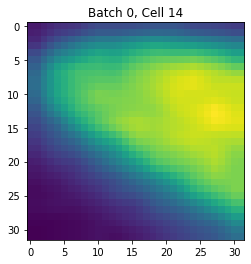

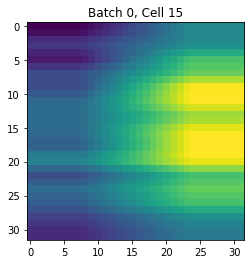

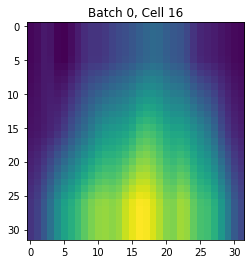

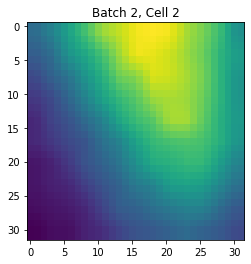

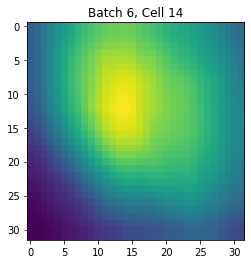

...

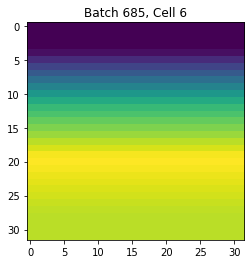

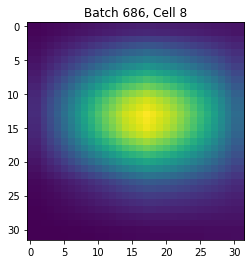

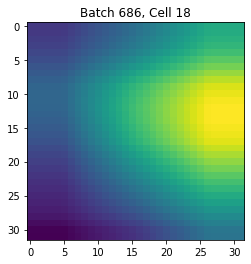

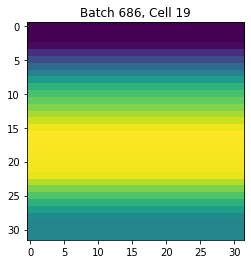

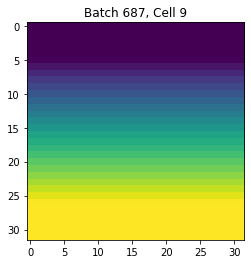

In [22]:
import os
import matplotlib.pyplot as plt

for batch in range(num_batches):
    possibly_died_batch = possibly_died.get(batch)
    for cell in possibly_died_batch:
        results_dir = 'cleaned_possible_death_appearances/batch_{}/'.format(batch, batch, cell)
        if not os.path.isdir(results_dir):
            os.makedirs(results_dir)
        fig, ax = plt.subplots()
        ax.imshow(cell_tracks.appearances[batch][possibly_died.get(batch).get(cell)][cell - 1])
        ax.set_title('Batch {}, Cell {}'.format(batch, cell))
        plt.savefig(results_dir + 'batch_{}_cell_{}.jpg'.format(batch, cell))
        plt.show()

In [25]:
import pickle

In [27]:
write_file = open('possibly_died', 'wt')
write_file.write(str(possibly_died))

15136

In [28]:
write_file.close()

In [29]:
write_file = open('possible_death_lineages', 'wt')
write_file.write(str(possible_death_lineages))

1635891

In [30]:
write_file.close()